## Assignment for Week 4 - Decision Trees and Random Forest

### Exercise:
German credit dataset: located in the assign_wk4 folder

**Objective:** to minimize loss from the bank’s perspective.

Bank (by loan manager) needs to decide who will get loan approval based on the applicants’ demographic and socio-economic profiles. The data set consists of 20 variables and classification on applicant whether he/she has good or bad credit risk. The predictive model will provide guidance in making loan approval decision on prospective applicants based on clients’ profiles.

From the given data set, perform the task using decision tree. 
* What are your findings?
* Plot and interpret the tree.
* Prune the tree from the previous result. 
   - Does the pruned tree show any performance improvement?  
   - What attributes are found in the pruned tree?  
* Conclude your finding.

From the given data set, perform the task using random forest. 
* Summarize your finding.

Compare results of decision tree and random forest.

### Deliverables:

Upload your notebook's .ipynb file.
   
**Important:** Make sure your provide complete and thorough explanations for all of your analysis. You need to defend your thought processes and reasoning.

## Introduction
***

The plan for this weeks lab on decision trees and random forests will be to consume bank data in order to predict a binary default risk presented by the borrower. We will be using the german_credit_risk.csv, with additional details from german_credit_risk_names.doc. We will perform any data preparation that is required and then train our models. First we will use a decision tree model, and try pruning manually to improve performance. Second we will implement a random forest, and compare the results of our various methods.

### Setup

In [1]:
# Utilities
import pandas as pd
import numpy as np
import collections
from subprocess import call

# Sklearn utilities
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

# Sklearn Tree and Random Forest Models
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import export_graphviz
from IPython.display import Image
from sklearn.metrics import plot_confusion_matrix
import pydotplus
%matplotlib inline
sns.set()

import warnings
warnings.filterwarnings("ignore")

In [2]:
!head assign_wk4/german_credit_risk.csv

In [3]:
!head assign_wk4/german_credit_risk_names.doc

Description of the German credit dataset.

1. Title: German Credit data

2. Source Information

Professor Dr. Hans Hofmann  
Institut f"ur Statistik und "Okonometrie  
Universit"at Hamburg  
FB Wirtschaftswissenschaften  


The majority of the document elaborates on the meaning of each classification for object columns. One key insight from the names document is that the Cost.Matrix is the actual classification 1 = Good, 2 = Bad, and that there is an associated cost function where classification of 1 when actually 2 costs 5x as much as classifying 2 when actually 1.

In [4]:
bank_df = pd.read_csv('assign_wk4/german_credit_risk.csv')
bank_df

,Checking.Account,Duration,Credit.Hist,Purpose,Credit.Amount,Saving.Account,Employmnet,Disposable.Income,Personal.Status,Other.Debtors,...,Property,Age,Other.Loans,Housing,Existing.Credits,Job,Number.Liable,Telephone,Foreign.Worker,Cost.Matrix
0,A11,6,A34,A43,1169,A65,A75,4,A93,A101,...,A121,67,A143,A152,2,A173,1,A192,A201,1
1,A12,48,A32,A43,5951,A61,A73,2,A92,A101,...,A121,22,A143,A152,1,A173,1,A191,A201,2
2,A14,12,A34,A46,2096,A61,A74,2,A93,A101,...,A121,49,A143,A152,1,A172,2,A191,A201,1
3,A11,42,A32,A42,7882,A61,A74,2,A93,A103,...,A122,45,A143,A153,1,A173,2,A191,A201,1
4,A11,24,A33,A40,4870,A61,A73,3,A93,A101,...,A124,53,A143,A153,2,A173,2,A191,A201,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,A14,12,A32,A42,1736,A61,A74,3,A92,A101,...,A121,31,A143,A152,1,A172,1,A191,A201,1
996,A11,30,A32,A41,3857,A61,A73,4,A91,A101,...,A122,40,A143,A152,1,A174,1,A192,A201,1
997,A14,12,A32,A43,804,A61,A75,4,A93,A101,...,A123,38,A143,A152,1,A173,1,A191,A201,1
998,A11,45,A32,A43,1845,A61,A73,4,A93,A101,...,A124,23,A143,A153,1,A173,1,A192,A201,2


In [5]:
bank_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Checking.Account   1000 non-null   object
 1   Duration           1000 non-null   int64 
 2   Credit.Hist        1000 non-null   object
 3   Purpose            1000 non-null   object
 4   Credit.Amount      1000 non-null   int64 
 5   Saving.Account     1000 non-null   object
 6   Employmnet         1000 non-null   object
 7   Disposable.Income  1000 non-null   int64 
 8   Personal.Status    1000 non-null   object
 9   Other.Debtors      1000 non-null   object
 10  Present.Residence  1000 non-null   int64 
 11  Property           1000 non-null   object
 12  Age                1000 non-null   int64 
 13  Other.Loans        1000 non-null   object
 14  Housing            1000 non-null   object
 15  Existing.Credits   1000 non-null   int64 
 16  Job                1000 non-null   object
 

In [6]:
bank_df.describe(include='all')

,Checking.Account,Duration,Credit.Hist,Purpose,Credit.Amount,Saving.Account,Employmnet,Disposable.Income,Personal.Status,Other.Debtors,...,Property,Age,Other.Loans,Housing,Existing.Credits,Job,Number.Liable,Telephone,Foreign.Worker,Cost.Matrix
count,1000,1000.000000,1000,1000,1000.000000,1000,1000,1000.000000,1000,1000,...,1000,1000.000000,1000,1000,1000.000000,1000,1000.000000,1000,1000,1000.000000
unique,4,NaN,5,10,NaN,5,5,NaN,4,3,...,4,NaN,3,3,NaN,4,NaN,2,2,NaN
top,A14,NaN,A32,A43,NaN,A61,A73,NaN,A93,A101,...,A123,NaN,A143,A152,NaN,A173,NaN,A191,A201,NaN
freq,394,NaN,530,280,NaN,603,339,NaN,548,907,...,332,NaN,814,713,NaN,630,NaN,596,963,NaN
mean,NaN,20.903000,NaN,NaN,3271.258000,NaN,NaN,2.973000,NaN,NaN,...,NaN,35.546000,NaN,NaN,1.407000,NaN,1.155000,NaN,NaN,1.300000
std,NaN,12.058814,NaN,NaN,2822.736876,NaN,NaN,1.118715,NaN,NaN,...,NaN,11.375469,NaN,NaN,0.577654,NaN,0.362086,NaN,NaN,0.458487
min,NaN,4.000000,NaN,NaN,250.000000,NaN,NaN,1.000000,NaN,NaN,...,NaN,19.000000,NaN,NaN,1.000000,NaN,1.000000,NaN,NaN,1.000000
25%,NaN,12.000000,NaN,NaN,1365.500000,NaN,NaN,2.000000,NaN,NaN,...,NaN,27.000000,NaN,NaN,1.000000,NaN,1.000000,NaN,NaN,1.000000
50%,NaN,18.000000,NaN,NaN,2319.500000,NaN,NaN,3.000000,NaN,NaN,...,NaN,33.000000,NaN,NaN,1.000000,NaN,1.000000,NaN,NaN,1.000000
75%,NaN,24.000000,NaN,NaN,3972.250000,NaN,NaN,4.000000,NaN,NaN,...,NaN,42.000000,NaN,NaN,2.000000,NaN,1.000000,NaN,NaN,2.000000


<AxesSubplot:>

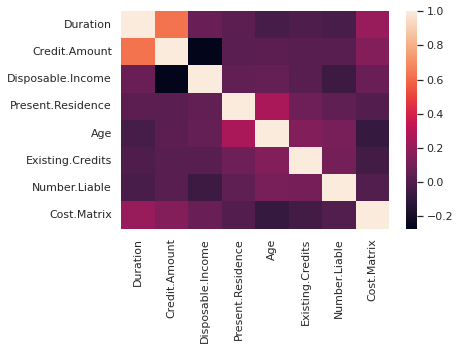

In [7]:
sns.heatmap(bank_df.corr())

Our data looks clean, no NA's or anything, and our column names are readable. There also doesn't appear to be much that immediately jumps out as correlated to our Cost.Matrix field, but we have done nothing to  Our classes for those columns are not, so we may need to map them to something better from our names doc when we need more explainability.

**Encoding Categorical Columns**

In [8]:
# separate the object columns for encoding
obj_df = bank_df.select_dtypes(include=['object']).copy()

In [9]:
bank_df = pd.get_dummies(bank_df, columns=obj_df.columns)

In [10]:
# looking at our df's new shape
bank_df

,Duration,Credit.Amount,Disposable.Income,Present.Residence,Age,Existing.Credits,Number.Liable,Cost.Matrix,Checking.Account_A11,Checking.Account_A12,...,Housing_A152,Housing_A153,Job_A171,Job_A172,Job_A173,Job_A174,Telephone_A191,Telephone_A192,Foreign.Worker_A201,Foreign.Worker_A202
0,6,1169,4,4,67,2,1,1,1,0,...,1,0,0,0,1,0,0,1,1,0
1,48,5951,2,2,22,1,1,2,0,1,...,1,0,0,0,1,0,1,0,1,0
2,12,2096,2,3,49,1,2,1,0,0,...,1,0,0,1,0,0,1,0,1,0
3,42,7882,2,4,45,1,2,1,1,0,...,0,1,0,0,1,0,1,0,1,0
4,24,4870,3,4,53,2,2,2,1,0,...,0,1,0,0,1,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,12,1736,3,4,31,1,1,1,0,0,...,1,0,0,1,0,0,1,0,1,0
996,30,3857,4,4,40,1,1,1,1,0,...,1,0,0,0,0,1,0,1,1,0
997,12,804,4,4,38,1,1,1,0,0,...,1,0,0,0,1,0,1,0,1,0
998,45,1845,4,4,23,1,1,2,1,0,...,0,1,0,0,1,0,0,1,1,0


In [11]:
bank_df.info() # ensure that we have no object columns left

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 62 columns):
 #   Column                Non-Null Count  Dtype
---  ------                --------------  -----
 0   Duration              1000 non-null   int64
 1   Credit.Amount         1000 non-null   int64
 2   Disposable.Income     1000 non-null   int64
 3   Present.Residence     1000 non-null   int64
 4   Age                   1000 non-null   int64
 5   Existing.Credits      1000 non-null   int64
 6   Number.Liable         1000 non-null   int64
 7   Cost.Matrix           1000 non-null   int64
 8   Checking.Account_A11  1000 non-null   uint8
 9   Checking.Account_A12  1000 non-null   uint8
 10  Checking.Account_A13  1000 non-null   uint8
 11  Checking.Account_A14  1000 non-null   uint8
 12  Credit.Hist_A30       1000 non-null   uint8
 13  Credit.Hist_A31       1000 non-null   uint8
 14  Credit.Hist_A32       1000 non-null   uint8
 15  Credit.Hist_A33       1000 non-null   uint8
 16  Credit.

**Naive classification**

In [12]:
bank_df['Cost.Matrix'].value_counts()

1    700
2    300
Name: Cost.Matrix, dtype: int64

In [13]:
# Our naive likelihood is 70% classified as 'Good'
# Considering our cost function however we need to have a high threshold for classification of 'Good'

# Example scoring of cost function on naive classifiers of all good and all bad
naive_good_class_cost = ('All Good', 300*5)
naive_bad_class_cost = ('All Bad', 700*1)

# Even though we can get 70% accuracy with all good, our cost is better when assuming all bad
min([naive_bad_class_cost, naive_good_class_cost], key=lambda x:x[1])

('All Bad', 700)

## Decision Tree
***

Our first approach will be with a decision tree. We will want to split our data into test and train sets, using Cost.Matrix as our target classification, and fit a decision tree from our sklearn package.

**Split the dataset into training and testing**

In [14]:
# Adapted from https://worldclass.regis.edu/d2l/le/content/287315/viewContent/4178156/View
# get column names
cols = bank_df.columns

# split column names into target and features
target = 'Cost.Matrix'
features = [col for col in cols if col != target]

x = bank_df[features].values
y = bank_df[target].values

# split dataset into training and test data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

**Setup Decision Tree Model**

In [15]:
# Adapted from https://worldclass.regis.edu/d2l/le/content/287315/viewContent/4178156/View
# establish and fit the model using DecisonTree()
tree_model = tree.DecisionTreeClassifier()
tree_model.fit(x_train, y_train)

# store predictions
preds = tree_model.predict(x_test)

In [16]:
# Adapted from https://worldclass.regis.edu/d2l/le/content/287315/viewContent/4178156/View
print('Actual values for test data set:')
print(y_test)
print('Predicted values for test data set:')
print(preds)

Actual values for test data set:
[2 1 1 1 1 1 1 1 1 1 1 2 1 2 2 2 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 2 1 1 1 1
 1 1 2 1 1 1 1 1 1 2 2 2 1 2 1 1 2 1 1 1 2 1 1 1 2 2 1 1 1 1 1 1 2 1 1 1 1
 1 2 2 1 2 2 1 1 1 1 1 2 2 2 1 1 1 1 2 1 1 1 1 1 2 2 1 2 2 1 1 1 1 1 1 2 2
 1 1 1 1 1 2 2 1 1 1 1 1 1 2 2 2 1 1 1 1 2 2 1 1 1 2 1 1 1 2 1 2 1 1 2 1 1
 2 2 1 1 1 2 1 1 1 1 1 2 2 1 2 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1
 2 2 1 1 1 2 1 2 2 2 1 2 1 1 1]
Predicted values for test data set:
[1 2 1 2 1 2 1 1 1 1 1 2 2 2 2 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 2 2 1 1 1 1
 1 1 2 2 1 1 1 1 2 2 1 2 1 2 1 2 2 1 1 1 1 2 1 1 2 1 1 2 2 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 2 1 1 1 2 1 1 1 1 2 2 1 2 1 2 2 1 1 2 1 1 1 1 1 2 1 2 2
 1 1 1 1 1 2 1 1 2 2 1 1 1 1 1 2 1 2 1 1 1 1 1 2 1 1 1 1 1 2 1 2 1 1 2 2 1
 2 1 1 2 1 2 1 1 1 1 1 2 2 1 1 2 1 1 1 1 2 2 1 1 1 1 1 2 1 1 1 2 1 1 1 2 1
 1 2 1 1 1 1 2 1 2 2 1 2 2 2 1]


1    141
2     59
dtype: int64


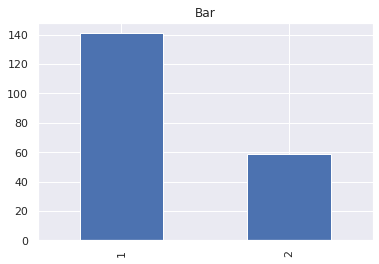

In [17]:
# Adapted from https://worldclass.regis.edu/d2l/le/content/287315/viewContent/4178156/View
test_counts=pd.value_counts(y_test, sort=True)
test_counts.plot(kind='bar')
plt.title('Bar')
print(test_counts)

1    139
2     61
dtype: int64


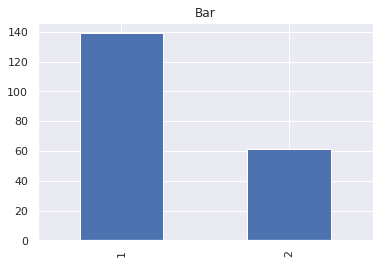

In [18]:
# Adapted from https://worldclass.regis.edu/d2l/le/content/287315/viewContent/4178156/View
pred_counts=pd.value_counts(preds, sort=True)
pred_counts.plot(kind='bar')
plt.title('Bar')
print(pred_counts)

**Model Evaluation**

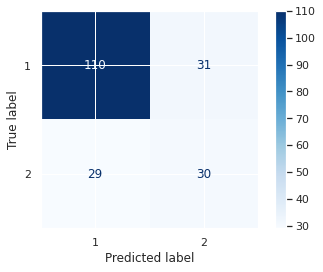

In [19]:
plot_confusion_matrix(tree_model, x_test, y_test, cmap='Blues')

In [20]:
cm = confusion_matrix(y_test, preds)

In [21]:
# Implementation of calculating the cost function outlined within the names doc
def cost_function(matrix):
    cost = 0
    row_costs = [1, 5]
    np.fill_diagonal(matrix, 0)
    for i, row in enumerate(matrix):
        cost += sum(row)*row_costs[i]
    return cost

In [22]:
print(f'Cost: {cost_function(cm)}')

Cost: 176


In [23]:
print(f'Accuracy: {accuracy_score(y_test, preds):.3f}')

Accuracy: 0.700


Interesting, our accuracy is the same as our naive approach but with a much better score on the cost function.

**Feature Importance**

In [24]:
def all_features(sorted_feature):
    max_feature_len = len(sorted_feature)
    for feature, rank in sorted_feature:
        dots = max_feature_len - len(feature)
        print(f'{feature}: {"."*dots} {rank*100:.2f}%')

In [25]:
# Adapted from https://worldclass.regis.edu/d2l/le/content/287315/viewContent/4178156/View
# display the importance features

importance_list = list(zip(features,tree_model.feature_importances_))
sorted_import_feature = sorted(importance_list, key = lambda x: x[1],reverse=True)
sorted_import_feature[:10]

[('Credit.Amount', 0.13610298202290746),
 ('Duration', 0.09749475236164137),
 ('Checking.Account_A14', 0.09092637237281981),
 ('Age', 0.08945280765567866),
 ('Purpose_A43', 0.04056229942648),
 ('Other.Loans_A143', 0.0316473375355551),
 ('Purpose_A40', 0.02731033320630927),
 ('Disposable.Income', 0.025588571660286073),
 ('Personal.Status_A94', 0.025490726720303614),
 ('Saving.Account_A61', 0.02487363776687176)]

In [26]:
all_features(sorted_import_feature)

Credit.Amount: ................................................ 13.61%
Duration: ..................................................... 9.75%
Checking.Account_A14: ......................................... 9.09%
Age: .......................................................... 8.95%
Purpose_A43: .................................................. 4.06%
Other.Loans_A143: ............................................. 3.16%
Purpose_A40: .................................................. 2.73%
Disposable.Income: ............................................ 2.56%
Personal.Status_A94: .......................................... 2.55%
Saving.Account_A61: ........................................... 2.49%
Credit.Hist_A32: .............................................. 2.22%
Housing_A152: ................................................. 2.14%
Credit.Hist_A31: .............................................. 2.10%
Telephone_A191: ............................................... 1.92%
Present.Residence: 

From our feature importance it looks like our key features are the credit amount, age, checking account A14:'no checking account', duration, purpose A43: 'radio/television', credit history A32: 'existing credits paid back duly till now', disposable income, other loans A143: 'none', personal status A94: 'male: married/widowed', job A173: 'skilled employee / official'.

**Visualizing the Tree**

In [27]:
# Adapted from https://worldclass.regis.edu/d2l/le/content/287315/viewContent/4178156/View
dot_data = tree.export_graphviz(tree_model,
                                feature_names=features,
                                out_file=None,
                                filled=True,
                                rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data)

colors = ('turquoise', 'orange')
edges = collections.defaultdict(list)

for edge in graph.get_edge_list():
    edges[edge.get_source()].append(int(edge.get_destination()))

for edge in edges:
    edges[edge].sort()    
    for i in range(2):
        dest = graph.get_node(str(edges[edge][i]))[0]
        dest.set_fillcolor(colors[i])

graph.write_png('bank_decisiontree.png')

True

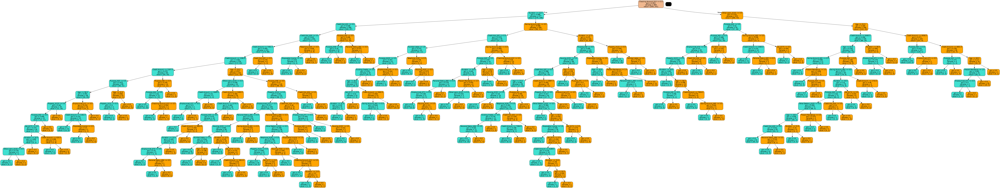

In [28]:
Image('bank_decisiontree.png')

**Pruning**

In [29]:
# Adapted from https://worldclass.regis.edu/d2l/le/content/287315/viewContent/4178156/View
# establish and fit the model using DecisonTree()
tree_model_pre_pruned = tree.DecisionTreeClassifier(max_depth=3)
tree_model_pre_pruned.fit(x_train, y_train)

# store predictions
preds = tree_model_pre_pruned.predict(x_test)

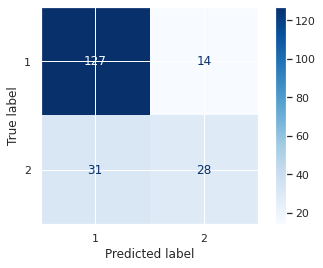

In [30]:
plot_confusion_matrix(tree_model_pre_pruned, x_test, y_test, cmap='Blues')

In [31]:
cm = confusion_matrix(y_test, preds)

In [32]:
print(f'Cost: {cost_function(cm)}')

Cost: 169


In [33]:
print(f'Accuracy: {accuracy_score(y_test, preds):.3f}')

Accuracy: 0.775


Excellent, we see improvement both in our cost function and in the accuracy of our model with a much lower decision depth.

In [55]:
# Adapted from https://worldclass.regis.edu/d2l/le/content/287315/viewContent/4178156/View
dot_data = tree.export_graphviz(tree_model_pre_pruned,
                                feature_names=features,
                                out_file=None,
                                filled=True,
                                rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data)

colors = ('turquoise', 'orange')
edges = collections.defaultdict(list)

for edge in graph.get_edge_list():
    edges[edge.get_source()].append(int(edge.get_destination()))

for edge in edges:
    edges[edge].sort()    
    for i in range(2):
        dest = graph.get_node(str(edges[edge][i]))[0]
        dest.set_fillcolor(colors[i])

graph.write_png('pruned_decisiontree.png')

True

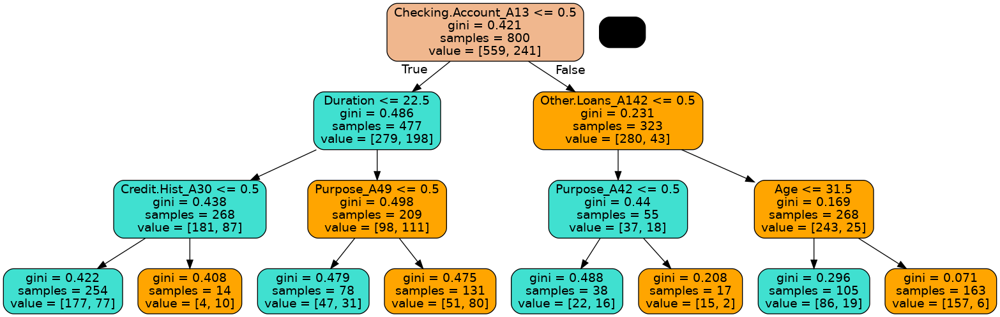

In [56]:
Image(filename='pruned_decisiontree.png')

**Attributes in the pruned tree**

1. Checking.Account_A13: account value greater than or equal to 200 DM for at least 1 year
2. Duration
3. Other.Loans_A142: Store Loans
4. Credit.Hist_A30: All credit paid back duly
5. Purpose_A49: Business Loan
6. Purpose_A42: Furniture/Equipment Loan
7. Age

## Random Forest
***

Now we will do the same using the Random Forest Classifier, which is an ensemble method of using many decision trees.

**Setup Random Forest**

In [34]:
# Adapted from https://worldclass.regis.edu/d2l/le/content/287315/viewContent/4178156/View
# establish and fit the model using RandomForestClassifier

forest_model = RandomForestClassifier(n_jobs = -1, random_state=42)
forest_model.fit(x_train,y_train)

#gathering the predictions
forest_preds = forest_model.predict(x_test)

In [35]:
#display the actuals and predictions for the test set
print('Actuals for test data set')
print(y_test)
print('Predictions for test data set')
print(forest_preds)

Actuals for test data set
[2 1 1 1 1 1 1 1 1 1 1 2 1 2 2 2 1 1 2 1 1 2 1 1 1 2 1 1 1 1 1 1 2 1 1 1 1
 1 1 2 1 1 1 1 1 1 2 2 2 1 2 1 1 2 1 1 1 2 1 1 1 2 2 1 1 1 1 1 1 2 1 1 1 1
 1 2 2 1 2 2 1 1 1 1 1 2 2 2 1 1 1 1 2 1 1 1 1 1 2 2 1 2 2 1 1 1 1 1 1 2 2
 1 1 1 1 1 2 2 1 1 1 1 1 1 2 2 2 1 1 1 1 2 2 1 1 1 2 1 1 1 2 1 2 1 1 2 1 1
 2 2 1 1 1 2 1 1 1 1 1 2 2 1 2 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1
 2 2 1 1 1 2 1 2 2 2 1 2 1 1 1]
Predictions for test data set
[1 1 2 1 1 1 1 1 1 1 1 2 1 2 2 1 1 1 2 1 1 2 1 1 1 1 1 1 1 1 1 1 2 1 1 1 2
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 1 1 2 1 1 1 1 1 2 1 1 1 1 1 1
 1 1 1 1 1 2 1 1 1 1 1 1 2 2 1 1 1 1 2 1 1 1 1 1 2 1 1 1 1 1 1 1 1 2 1 2 2
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2 1 1 2 1 1
 2 2 1 1 1 1 1 1 1 1 1 1 2 1 2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 1 1 1 1 1 2 1 1 1 2 2 1 1]


**Model Evaluation**

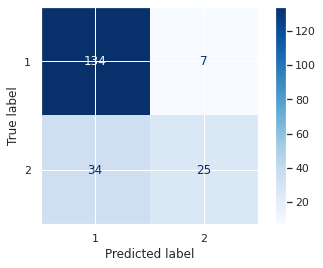

In [36]:
plot_confusion_matrix(forest_model, x_test, y_test, cmap='Blues')

In [37]:
cm = confusion_matrix(y_test, forest_preds)

In [38]:
print(f'Cost: {cost_function(cm)}')

Cost: 177


In [39]:
print(f'Accuracy: {accuracy_score(y_test, forest_preds):.3f}')

Accuracy: 0.795


It looks like our Random Forest has better accuracy, but the cost function is better optimized by our pruned tree.

**Feature Importance**

In [40]:
# display the importance features with our tree

importance_list = list(zip(features,forest_model.feature_importances_))
sorted_import_feature = sorted(importance_list, key = lambda x: x[1],reverse=True)
sorted_import_feature[:10]

[('Credit.Amount', 0.09433462204943346),
 ('Age', 0.08316531766963019),
 ('Duration', 0.07586519660906911),
 ('Checking.Account_A14', 0.045883502098668864),
 ('Checking.Account_A11', 0.03687980243066257),
 ('Disposable.Income', 0.03556207967082236),
 ('Present.Residence', 0.03338721233580748),
 ('Purpose_A40', 0.02220435683078246),
 ('Credit.Hist_A34', 0.02092823082012479),
 ('Existing.Credits', 0.01973405572320074)]

In [41]:
all_features(sorted_import_feature)

Credit.Amount: ................................................ 9.43%
Age: .......................................................... 8.32%
Duration: ..................................................... 7.59%
Checking.Account_A14: ......................................... 4.59%
Checking.Account_A11: ......................................... 3.69%
Disposable.Income: ............................................ 3.56%
Present.Residence: ............................................ 3.34%
Purpose_A40: .................................................. 2.22%
Credit.Hist_A34: .............................................. 2.09%
Existing.Credits: ............................................. 1.97%
Saving.Account_A61: ........................................... 1.86%
Housing_A152: ................................................. 1.61%
Other.Loans_A143: ............................................. 1.60%
Property_A123: ................................................ 1.59%
Checking.Account_A12

**Visualizing a Tree from the Random Forest**

In [51]:
estimator= forest_model.estimators_[42] #extract one tree to test

In [52]:
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = features,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

In [53]:
call (['dot', '-Tpng', 'tree.dot', '-o', 'random_forest.png', '-Gdpi=600'])

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.414379 to fit


0

In [54]:
Image(filename='random_forest.png')

## Conclusion
***

After applying three different models on the banking data we observed the following results. The unbounded decision tree had 0.700 accuracy with an associated cost function value of 176. The pruned decision tree had 0.775 accuracy with an associated cost function value of 169. The random forest had 0.795 accuracy with an associated cost function value of 177. The cost function was not mentioned as a metric within the assignment so I will focus on the accuracy, but wanted to report the values as they would be important in a real world implementation of this model where we would implement the pruned decision tree.

Pruning the decision tree improved performance, and decreased complexity. This could be further optimized by grid search through the available depths and features. The random forest had better accuracy than the pruned decision tree out of the box, but did have the highest cost function value associated with it so tuning the decision weights would likely produce a better cost function optimization when compared to the decision tree.

## References:
***

Guide to Encoding Categorical Values in Python—Practical Business Python. (n.d.). Retrieved May 29, 2022, from https://pbpython.com/categorical-encoding.html.

McCarthy, J. (2007). What is Artificial Intelligence? Stanford University. Retrieved from http://www.formal.stanford.edu/jmc/whatisai/whatisai.html.